This file generates all required graphs for our paper at https://arxiv.org/abs/2502.16212

In [1]:
import numpy as np
import pickle

def save_data(data_list, filename='qubo_data.pkl'):
    with open(filename, 'wb') as f:
        # Serializing the data list using pickle
        pickle.dump(data_list, f)

def load_data(filename='qubo_data.pkl'):
    with open(filename, 'rb') as f:
        # Deserializing the data from the file
        data_list = pickle.load(f)
    return data_list

method2label = {'impact':'Impact-Indexing','cluster':'Cluster','pool':'Certainty-Degree'}

# Scaling sub-qubo size

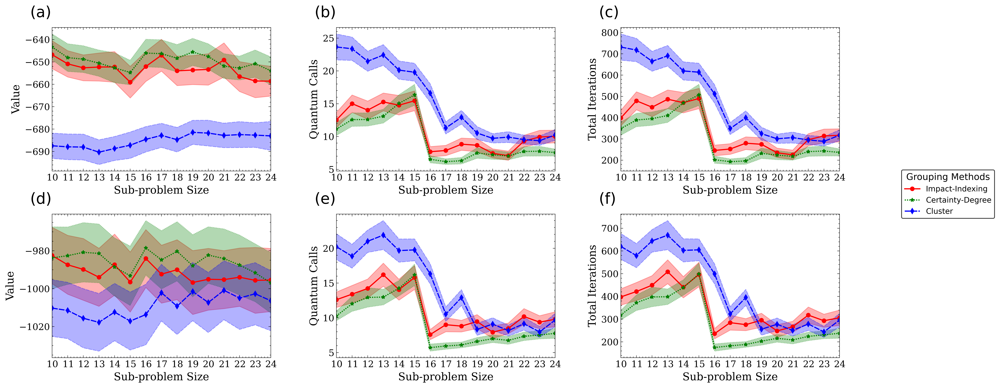

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import scienceplots
import matplotlib.font_manager as fm

# Load data
data_list_3regular = load_data('../data/100Node3Regular_d_data.pkl')
data_list_erdos = load_data('../data/100er_d_data.pkl')

# Set up the plot
with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axs = plt.subplots(2, 3, figsize=(10.8*1.5, 7.2))

metrics = ['val', 'quantum_calls', 'total_iters']
metric_labels = {'val': 'Value', 'quantum_calls': 'Quantum Calls', 'total_iters': 'Total Iterations'}
graph_types = ['3-regular', 'Erdős–Rényi']
method_names = ['impact', 'pool', 'cluster']
method_colors = {'impact': 'red', 'pool': 'green', 'cluster': 'blue'}
method_labels = {'impact': 'Impact-Indexing', 'pool': 'Certainty-Degree', 'cluster': 'Cluster'}
method_linestyles = {'impact': '-', 'pool': (0, (1, 1)), 'cluster': (0, (5, 1))}
method_markers = {'impact': 'o', 'pool': '*', 'cluster': 'd'}

Line_set_width = 1.5
marker_set_size = 5
alpha_set = 0.3

def plot_metric(ax, data_list, metric, graph_type, subplot_index):
    qubit_sizes = range(10, 25)
    for method in method_names:
        means = []
        sems = []
        for qs in qubit_sizes:
            values = [entry[f'results_{method}'][qs][metric] for entry in data_list if qs in entry[f'results_{method}']]
            means.append(np.mean(values) if values else np.nan)
            sems.append(np.std(values) / np.sqrt(len(values)) if values else np.nan)
        
        ax.plot(qubit_sizes, means, label=method_labels[method], linestyle=method_linestyles[method], 
                color=method_colors[method], marker=method_markers[method],
                markersize=marker_set_size, linewidth=Line_set_width)
        ax.fill_between(qubit_sizes, np.array(means) - 1.96 * np.array(sems),
                        np.array(means) + 1.96 * np.array(sems),
                        linestyle=method_linestyles[method], color=method_colors[method], alpha=alpha_set)
    
    ax.set_xlabel('Sub-problem Size', fontsize=14)
    ax.set_ylabel(metric_labels[metric], fontsize=14)
    ax.set_xlim([10, 24])
    ax.set_xticks(qubit_sizes)
    ax.text(-0.1, 1.05, f'({chr(97+subplot_index)})', transform=ax.transAxes,
            fontsize=20, va='bottom', ha='left')
    ax.tick_params(axis='both', which='major', labelsize=12)

subplot_index = 0
for i, (graph_type, data_list) in enumerate(zip(graph_types, [data_list_3regular, data_list_erdos])):
    for j, metric in enumerate(metrics):
        plot_metric(axs[i, j], data_list, metric, graph_type, subplot_index)
        subplot_index += 1

# Add legend to the right of the subplots
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title='Grouping Methods', title_fontsize=12,
           bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0,
           frameon=True, edgecolor='black', fontsize=10)

plt.tight_layout()
plt.subplots_adjust(right=0.95, hspace=0.3, wspace=0.3)  # Adjust to make room for the legend
plt.savefig('../fig/panel_scale.pdf', bbox_inches='tight')
plt.show()

# Fixed sub-qubo size

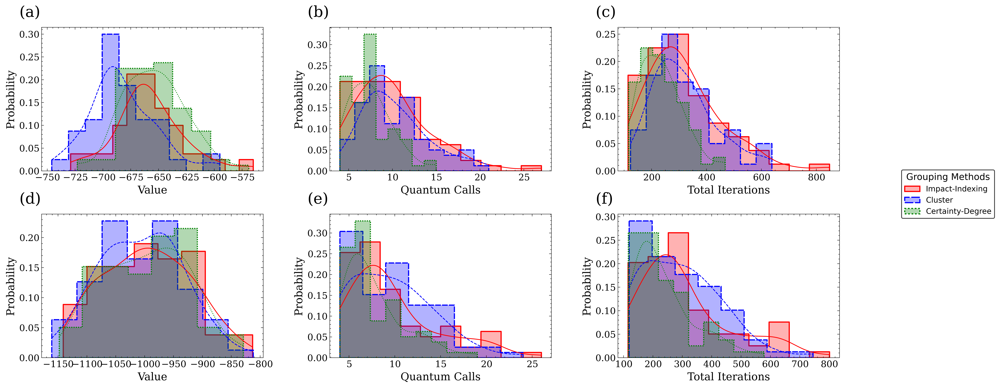

In [4]:
import seaborn as sns
# Load data for 3-regular graphs and Erdős–Rényi graphs
data_3regular = load_data('../data/100Node3Regular_d_data.pkl')
data_erdos = load_data('../data/100er_d_data.pkl')

# Process data for both graph types
graph_types = ['3-regular', 'Erdős–Rényi']
data_lists = [data_3regular, data_erdos]

for data_list in data_lists:
    for datum in data_list:
        for method in ['impact', 'cluster', 'pool']:
            datum[f'res_{method}'] = datum[f'results_{method}'][24]  # Use size 24

# Initialize data dictionaries for both graph types
data_dict = {
    graph_type: {
        method: {metric: [] for metric in ['val', 'quantum_calls', 'total_iters']}
        for method in ['impact', 'cluster', 'pool']
    }
    for graph_type in graph_types
}

# Fill data dictionaries
for graph_type, data_list in zip(graph_types, data_lists):
    for method in ['impact', 'cluster', 'pool']:
        for entry in data_list:
            for metric in ['val', 'quantum_calls', 'total_iters']:
                data_dict[graph_type][method][metric].append(entry[f'res_{method}'][metric])

# Plot settings
# Set up the plot
with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axes = plt.subplots(2, 3, figsize=(10.8*1.5, 7.2))

metrics = ['val', 'quantum_calls', 'total_iters']
metric_labels = {'val': 'Value', 'quantum_calls': 'Quantum Calls', 'total_iters': 'Total Iterations'}

# Plot histograms
with plt.style.context(['science', 'ieee', 'no-latex']):
    subplot_index = 0
    for i, graph_type in enumerate(graph_types):
        for j, metric in enumerate(metrics):
            ax = axes[i, j]
            for method in ['impact', 'cluster', 'pool']:
                sns.histplot(data_dict[graph_type][method][metric], kde=True, 
                             label=method_labels[method], element='step', stat='probability', 
                             alpha=alpha_set, ax=ax, color=method_colors[method], 
                             linestyle=method_linestyles[method], linewidth=Line_set_width)
            
            ax.text(-0.1, 1.05, f'({chr(97+subplot_index)})', transform=ax.transAxes,
            fontsize=20, va='bottom', ha='left')
            ax.tick_params(axis='both', which='major', labelsize=12)
            ax.set_xlabel(metric_labels[metric], fontsize=14)
            ax.set_ylabel('Probability', fontsize=14)
            subplot_index += 1
# Add legend to the right of the subplots
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title='Grouping Methods', title_fontsize=12,
           bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0,
           frameon=True, edgecolor='black', fontsize=10)

plt.tight_layout()
plt.subplots_adjust(right=0.95, hspace=0.3, wspace=0.3)  # Adjust to make room for the legend

# Save the figure with the legend visible
plt.savefig('../fig/panel_fixed_d.pdf', bbox_inches='tight', dpi=300)
plt.show()


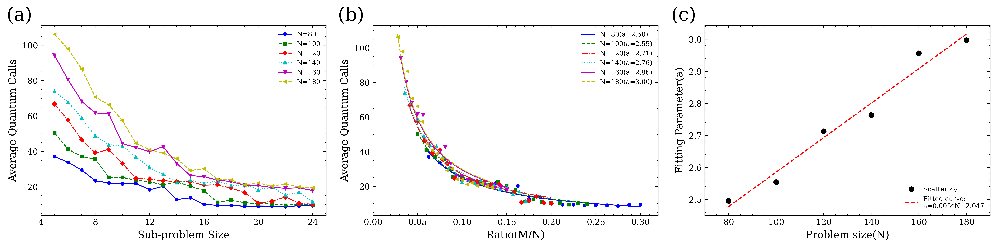

In [5]:
from scipy.optimize import curve_fit
from decimal import Decimal

# Load and process the data from the pickle file
filename = '../data/AllSizesNode3Regular_d_data_scale.pkl'
data = load_data(filename)

# define the algorithm (key) = 
key = 'results_cluster'

processed_results = {}
for size in [80, 100, 120, 140, 160, 180]:
    data_list = data[size]
    avg_values = {}
    for entry in data_list:
        for qubit_size, result in entry[key].items():
            if qubit_size not in avg_values:
                avg_values[qubit_size] = []
            
            if 'val' in result:
                avg_values[qubit_size].append(result['quantum_calls'])
            else:
                print(f"Unexpected result structure for size {size}, qubit_size {qubit_size}: {result}")

    avg_values = {k: np.mean(v) for k, v in avg_values.items()}
    processed_results[size] = avg_values

# define the lines style 
colors = ['b', 'g', 'r', 'c', 'm', 'y']
linestyles = ['-', '--', '-.', ':', '-', '--']
markers = ['o', 's', 'D', '^', 'v', '<']
markersize_set = 3
linewidth_set = 1

def linear_fit(x, a, b):
    return a * x + b

def inverse_fit(x, a):
    return a / x

def get_indexes(y_predict, y_data):
    n = y_data.size
    SSE = ((y_data - y_predict)**2).sum()
    MSE = SSE / n
    RMSE = np.sqrt(MSE)
    u = y_data.mean()
    SST = ((y_data - u)**2).sum()
    SSR = SST - SSE
    R_square = SSR / SST
    return SSE, MSE, RMSE, R_square

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axes = plt.subplots(1, 3, figsize=(15, 3.8))

    # First subplot
    for idx, (size, avg_values) in enumerate(processed_results.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        axes[0].plot(x[arg], y[arg], color=colors[idx], linestyle=linestyles[idx], marker=markers[idx], linewidth=linewidth_set, 
                markersize=markersize_set, label=f'N={size}')
    
    axes[0].set_xlim([4, 25])
    axes[0].set_xticks(np.arange(4, 25, 4))
    axes[0].set_ylabel('Average Quantum Calls', size=11)
    axes[0].set_xlabel('Sub-problem Size', size=11)
    axes[0].tick_params(labelsize=9)
    axes[0].legend(fontsize=7, loc='upper right')
    axes[0].text(-0.03, 1.1, '(a)', transform=axes[0].transAxes, fontsize=20, va='top', ha='right')

    # Second subplot
    fit_params = []
    for idx, (size, avg_values) in enumerate(processed_results.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        x_scaled = x/size
        axes[1].plot(x_scaled[arg], y[arg], color=colors[idx], linestyle='', marker=markers[idx], markersize=markersize_set)
        
        popt, _ = curve_fit(inverse_fit, x_scaled, y)
        fit_params.append((size, popt[0]))
        x_fit = np.linspace(min(x_scaled), max(x_scaled), 50)
        y_fit = inverse_fit(x_fit, *popt)     
        str_popt = Decimal(popt[0]).quantize(Decimal("0.00"))
        str_label = f'N={size}(a={str_popt})'
        axes[1].plot(x_fit, y_fit, color=colors[idx], linestyle=linestyles[idx], linewidth=linewidth_set, label=str_label)
    
    axes[1].set_xlim([0, 0.32])
    axes[1].set_ylabel('Average Quantum Calls', size=11)
    axes[1].set_xlabel('Ratio(M/N)', size=11)
    axes[1].tick_params(labelsize=9)
    axes[1].legend(fontsize=7, loc='upper right')
    axes[1].text(-0.03, 1.1, '(b)', transform=axes[1].transAxes, fontsize=20, va='top', ha='right')

    # Third subplot
    sizes, a_values = zip(*fit_params)
    axes[2].plot(sizes, a_values, linestyle='', marker='o', markersize=5, label='Scatter:$a_{N}$')
    
    popt, pcov = curve_fit(linear_fit, sizes, a_values)
    x_fit = np.linspace(min(sizes), max(sizes), 100)
    y_fit = linear_fit(x_fit, *popt)
    axes[2].plot(x_fit, y_fit, linestyle='--', linewidth=1.2, label=f'Fitted curve:\na={popt[0]:.3f}*N+{popt[1]:.3f}')
    
    axes[2].set_xlim([70, 190])
    axes[2].set_ylabel('Fitting Parameter(a)', size=11)
    axes[2].set_xlabel('Problem size(N)', size=11)
    axes[2].tick_params(labelsize=9)
    axes[2].legend(fontsize=7, loc='lower right')
    axes[2].text(-0.03, 1.1, '(c)', transform=axes[2].transAxes, fontsize=20, va='top', ha='right')

plt.tight_layout()
plt.savefig('../fig/scaling_smooth.pdf', bbox_inches='tight', dpi=300)
plt.show()

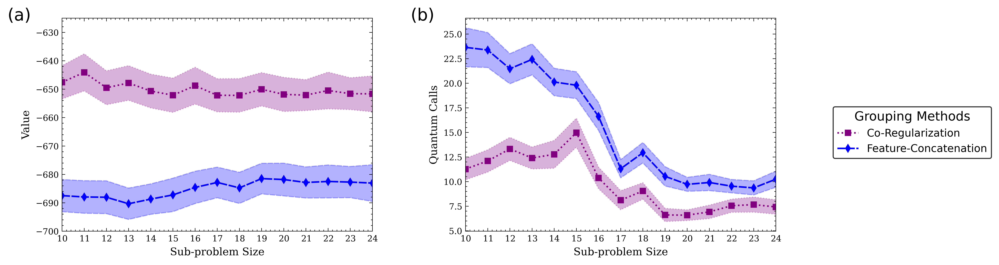

In [6]:
# %% [markdown]
# # Plot figures in Appendix about using Co-regularization cluster

# %% [markdown]
# ## Import data and function

# %%
import pickle
import numpy as np
import matplotlib.pyplot as plt

def load_data(filename):
    with open(filename, 'rb') as file:
        return pickle.load(file)

# Load data from file
data_list = load_data('../data/100Node3Regular_d_data.pkl')

# Set the full range of qubit sizes and other parameters
qubit_sizes = range(10, 25)
metrics = ['val', 'quantum_calls']
method_names = ['cluster_coreg', 'cluster']
method_colors = {'cluster_coreg': 'purple', 'cluster': 'blue'}
method_labels = {'cluster_coreg': 'Co-Regularization', 'cluster': 'Feature-Concatenation'}
method_linestyles = {'cluster_coreg': ':', 'cluster': (0, (5, 1))}
method_markers = {'cluster_coreg': 's', 'cluster': 'd'}

# Create a dictionary to hold the data for plotting
plot_data = {metric: {method: {qubit_size: [] for qubit_size in qubit_sizes} for method in method_names} for metric in metrics}

# Fill the dictionary with data
for entry in data_list:
    for qubit_size in qubit_sizes:
        for metric in metrics:
            for method in method_names:
                if qubit_size in entry[f'results_{method}']:
                    plot_data[metric][method][qubit_size].append(entry[f'results_{method}'][qubit_size][metric])

# %% [markdown]
# ### Plot the figures of value and quantum calls

# %%
# Set up plot parameters
line_width = 1.5
marker_size = 5
alpha = 0.3

qubit_sizes_array = list(qubit_sizes)

with plt.style.context(['science', 'ieee', 'no-latex']):
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10.8, 3.6))

for idx, (ax, metric, ylabel, ylim) in enumerate(zip(
    [ax1, ax2],
    metrics,
    ['Value', 'Quantum Calls'],
    [(-700, -625), None]
)):
    for method in method_names:
        means = [np.mean(plot_data[metric][method][qs]) if plot_data[metric][method][qs] else np.nan for qs in qubit_sizes]
        stds = [np.std(plot_data[metric][method][qs]) if plot_data[metric][method][qs] else np.nan for qs in qubit_sizes]
        sems = [stds[i] / np.sqrt(len(plot_data[metric][method][qs])) if plot_data[metric][method][qs] else np.nan for i, qs in enumerate(qubit_sizes)]

        ax.plot(qubit_sizes_array, means, label=method_labels[method], linestyle=method_linestyles[method], color=method_colors[method], 
                marker=method_markers[method], markersize=marker_size, linewidth=line_width)
        ax.fill_between(qubit_sizes_array, np.array(means) - 1.96 * np.array(sems), np.array(means) + 1.96 * np.array(sems), 
                        linestyle=method_linestyles[method], color=method_colors[method], alpha=alpha)

    ax.set_xlim([10, 24])
    if ylim:
        ax.set_ylim(ylim)
    ax.set_ylabel(ylabel, size=10)
    ax.set_xlabel('Sub-problem Size', size=10)
    ax.tick_params(labelsize=8)
    ax.set_xticks(qubit_sizes_array)
    ax.text(-0.1, 1.05, f'({chr(97+idx)})', transform=ax.transAxes, fontsize=16, va='top', ha='right')

# Create a single legend for the entire figure
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, title='Grouping Methods', title_fontsize=12,
           bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0,
           frameon=True, edgecolor='black', fontsize=10)

plt.tight_layout()
plt.subplots_adjust(right=0.95, wspace=0.3)  # Adjust to make room for the legend
plt.savefig('../fig/cluster_methods.pdf', bbox_inches='tight')
plt.show()

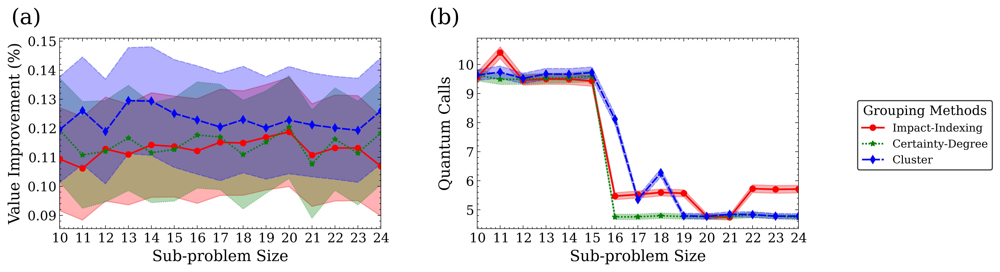

In [7]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import scienceplots

def load_data(filename):
    with open(filename, 'rb') as file:
        return pickle.load(file)
    
# Load data from the file
data_list = load_data('../data/100Node3Regular_d_data_tabu.pkl')

# Set the full range of qubit sizes and other parameters
qubit_sizes = range(10, 25)
metrics = ['val', 'quantum_calls']
method_names = ['impact', 'pool', 'cluster']
method_colors = {'impact': 'red', 'pool': 'green', 'cluster': 'blue'}
method_labels = {'impact': 'Impact-Indexing', 'pool': 'Certainty-Degree', 'cluster': 'Cluster'}
method_linestyles = {'impact': '-', 'pool': (0, (1, 1)), 'cluster': (0, (5, 1))}
method_markers = {'impact': 'o', 'pool': '*', 'cluster': 'd'}

# Create a dictionary to hold the data for plotting
plot_data = {metric: {method: {qubit_size: [] for qubit_size in qubit_sizes} for method in method_names} for metric in metrics}

# Fill the dictionary with data
tabu_values = []
for entry in data_list:
    tabu_val = entry['result_tabu'][1]
    for qubit_size in qubit_sizes:
        for metric in metrics:
            for method in method_names:
                if qubit_size in entry['results_' + method]:
                    if metric == 'val':
                        plot_data[metric][method][qubit_size].append((entry['results_' + method][qubit_size][metric] - tabu_val) / tabu_val * 100)
                    else:
                        plot_data[metric][method][qubit_size].append(entry['results_' + method][qubit_size][metric])
    tabu_values.append(tabu_val)

Line_set_width = 1.5
marker_set_size = 5
alpha_set = 0.3

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axs = plt.subplots(1, 2, figsize=(10.8, 3.6))

    for idx, (ax, metric, ylabel) in enumerate(zip(axs, metrics, ['Value Improvement (%)', 'Quantum Calls'])):
        for method in method_names:
            means = [np.mean(plot_data[metric][method][qs]) if plot_data[metric][method][qs] else np.nan for qs in qubit_sizes]
            sems = [np.std(plot_data[metric][method][qs]) / np.sqrt(len(plot_data[metric][method][qs])) if plot_data[metric][method][qs] else np.nan for qs in qubit_sizes]
            
            ax.plot(qubit_sizes, means, label=method_labels[method], linestyle=method_linestyles[method], 
                    color=method_colors[method], marker=method_markers[method],
                    markersize=marker_set_size, linewidth=Line_set_width)
            ax.fill_between(qubit_sizes, np.array(means) - 1.96 * np.array(sems),
                            np.array(means) + 1.96 * np.array(sems),
                            linestyle=method_linestyles[method], color=method_colors[method], alpha=alpha_set)
        
        ax.set_xlabel('Sub-problem Size', fontsize=14)
        ax.set_ylabel(ylabel, fontsize=14)
        ax.set_xlim([10, 24])
        ax.set_xticks(qubit_sizes)
        ax.text(-0.15, 1.05, f'({chr(97+idx)})', transform=ax.transAxes,
                fontsize=20, va='bottom', ha='left')
        ax.tick_params(axis='both', which='major', labelsize=12)

    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, title='Grouping Methods', title_fontsize=12,
               bbox_to_anchor=(1.02, 0.5), loc='center left', borderaxespad=0,
               frameon=True, edgecolor='black', fontsize=10)

plt.tight_layout()
plt.subplots_adjust(right=0.95, wspace=0.3)  # Adjust to make room for the legend
plt.savefig('../fig/tabu_comparison.pdf', bbox_inches='tight')
plt.show()


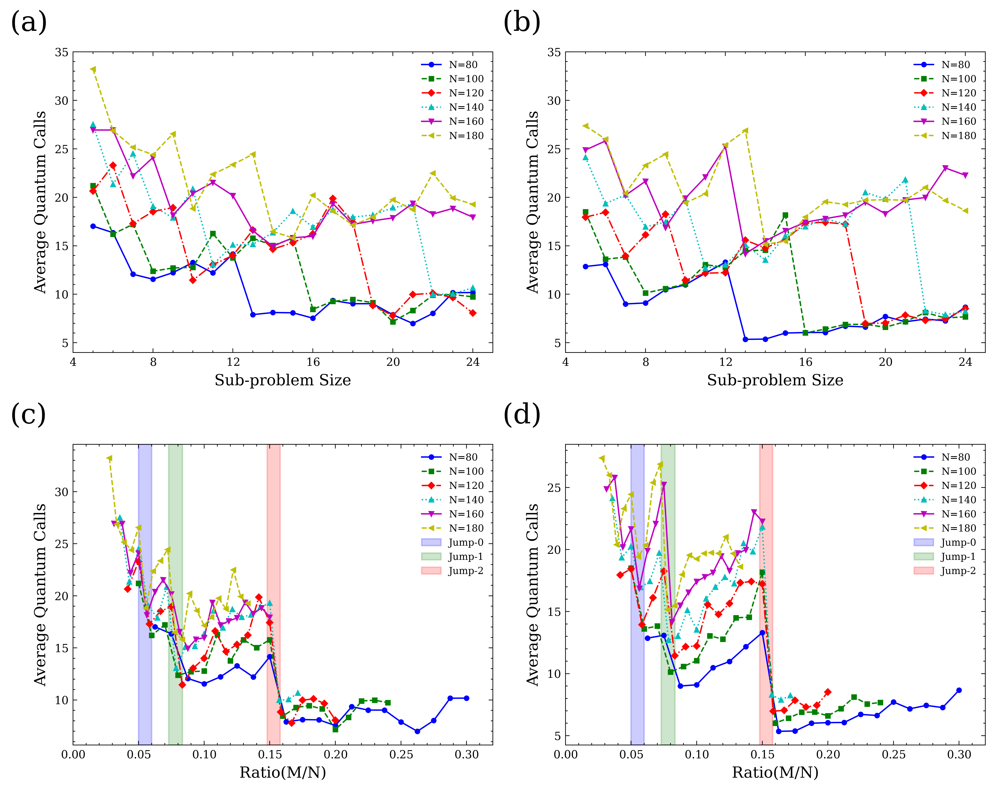

In [13]:
# %%
import matplotlib.pyplot as plt
import numpy as np
import pickle
from scipy.optimize import curve_fit


def load_data(filename):
    with open(filename, 'rb') as file:
        data = pickle.load(file)
    return data

# Load and process the data from the pickle file
filename = '../data/AllSizesNode3Regular_d_data_scale.pkl'
data = load_data(filename)

# %%
# Function to process results based on key
def process_results(data, key):
    processed_results = {}
    for size in [80, 100, 120, 140, 160, 180]:
        data_list = data[size]
        avg_values = {}
        for entry in data_list:
            for qubit_size, result in entry[key].items():
                if qubit_size not in avg_values:
                    avg_values[qubit_size] = []
                
                # Assuming result is a dictionary and the function value is under 'val' key
                if 'val' in result:
                    avg_values[qubit_size].append(result['quantum_calls'])
                else:
                    print(f"Unexpected result structure for size {size}, qubit_size {qubit_size}: {result}")

        avg_values = {k: np.mean(v) for k, v in avg_values.items()}
        processed_results[size] = avg_values
    return processed_results

# Process the data for both impact and pool
processed_results_impact = process_results(data, 'results_impact')
processed_results_pool = process_results(data, 'results_pool')

# %%
# define the lines style
colors = ['b', 'g', 'r', 'c', 'm', 'y']
linestyles = ['-', '--', '-.', ':', '-', '--']
markers = ['o', 's', 'D', '^', 'v', '<']
markersize_set = 3
linewidth_set = 1

with plt.style.context(['science', 'ieee', 'no-latex']):
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))

    # Plot for results_impact - Quantum Calls vs Sub-QUBO Size
    ax = axs[0, 0]
    for idx, (size, avg_values) in enumerate(processed_results_impact.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        ax.plot(x[arg], y[arg], color=colors[idx], linestyle=linestyles[idx], marker=markers[idx],
                linewidth=linewidth_set, markersize=markersize_set, label=f'N={size}')
    ax.set_xlim([4, 25])
    ax.set_ylim([4,35])
    sub_sizes_array = np.arange(4, 25, 4)
    ax.set_xticks(sub_sizes_array)
    ax.set_ylabel('Average Quantum Calls',  size=11)
    ax.set_xlabel('Sub-problem Size',  size=11)
    ax.legend(loc='upper right', fontsize=7)
    ax.text(-0.15, 1.05, '(a)', transform=ax.transAxes, fontsize=20, va='bottom', ha='left')

    # Plot for results_pool - Quantum Calls vs Sub-QUBO Size
    ax = axs[0, 1]
    for idx, (size, avg_values) in enumerate(processed_results_pool.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        ax.plot(x[arg], y[arg], color=colors[idx], linestyle=linestyles[idx], marker=markers[idx],
                linewidth=linewidth_set, markersize=markersize_set, label=f'N={size}')
    ax.set_xlim([4, 25])
    ax.set_ylim([4,35])
    sub_sizes_array = np.arange(4, 25, 4)
    ax.set_xticks(sub_sizes_array)
    ax.set_ylabel('Average Quantum Calls',  size=11)
    ax.set_xlabel('Sub-problem Size',  size=11)
    ax.legend(loc='upper right', fontsize=7)
    ax.text(-0.15, 1.05, '(b)', transform=ax.transAxes, fontsize=20, va='bottom', ha='left')

    # Plot for results_impact - Average Quantum Calls vs Ratio(M/N)
    ax = axs[1, 0]
    for idx, (size, avg_values) in enumerate(processed_results_impact.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        x_scaled = x / size
        ax.plot(x_scaled[arg], y[arg], color=colors[idx], linestyle=linestyles[idx], marker=markers[idx],
                linewidth=linewidth_set, markersize=markersize_set, label=f'N={size}')
    # Define the jump points for shading
    jump_points = [(0.05, 0.06), (0.073, 0.0835), (0.148, 0.158)]
    for idx, (start, end) in enumerate(jump_points):
        str_label = f'Jump-{idx}'
        ax.axvspan(start, end, color=colors[idx], alpha=0.2, label=str_label)
    ax.set_xlim([0, 0.32])
    ax.set_ylabel('Average Quantum Calls',  size=11)
    ax.set_xlabel('Ratio(M/N)',  size=11)
    ax.legend(loc='upper right', fontsize=7)
    ax.text(-0.15, 1.05, '(c)', transform=ax.transAxes, fontsize=20, va='bottom', ha='left')

    # Plot for results_pool - Average Quantum Calls vs Ratio(M/N)
    ax = axs[1, 1]
    for idx, (size, avg_values) in enumerate(processed_results_pool.items()):
        x = np.array(list(avg_values.keys()))
        y = np.array(list(avg_values.values()))
        arg = np.argsort(x)
        x_scaled = x / size
        ax.plot(x_scaled[arg], y[arg], color=colors[idx], linestyle=linestyles[idx], marker=markers[idx],
                linewidth=linewidth_set, markersize=markersize_set, label=f'N={size}')
    # Define the jump points for shading
    jump_points = [(0.05, 0.06), (0.073, 0.0835), (0.148, 0.158)]
    for idx, (start, end) in enumerate(jump_points):
        str_label = f'Jump-{idx}'
        ax.axvspan(start, end, color=colors[idx], alpha=0.2, label=str_label)
    ax.set_xlim([0, 0.32])
    ax.set_ylabel('Average Quantum Calls',  size=11)
    ax.set_xlabel('Ratio(M/N)',  size=11)
    ax.legend(loc='upper right', fontsize=7)
    ax.text(-0.15, 1.05, '(d)', transform=ax.transAxes, fontsize=20, va='bottom', ha='left')

plt.tight_layout()
plt.show()

# Save the figure
fig.savefig('../fig/scaling_jump.pdf', bbox_inches='tight')